<a href="https://colab.research.google.com/github/SalonicaJennifer/Assignment-1/blob/main/1_Cars_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
data = pd.read_csv("Cars_class.csv")

The objective of this dataset is to determine the type of vehicle using the features. Four models are: Bus, opel manta, saab & van

In [ ]:
type(data)

pandas.core.frame.DataFrame

In [ ]:
data.head()

,ID,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
0,1,88,39,70,166,66,7,148,44,19,134,167,332,143,69,5,13,193,201,0
1,2,85,35,64,129,57,6,116,57,17,125,138,200,123,65,1,23,196,203,3
2,3,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199,3
3,4,102,54,98,177,56,10,219,31,25,171,219,706,223,72,5,17,186,196,1
4,5,87,39,74,152,58,6,151,44,19,136,174,337,140,70,1,33,187,196,2


Features from above dataFrame:

1.Comp: Compactness

2.Circ: Circularity: measure of roundness of a vehicle. Circularity = 4π(Area)/(perimeter)**2.

 This formula calculates the circularity of the vehicle as the ratio of the vehicle's surface area to the square of its perimeter. The closer the circularity value is to 1, the more circular or rounded the vehicle's shape is.

3.D.Circ: Distance Circularity:One possible interpretation of this feature is the ratio of the vehicle's distance between the front and rear wheels (wheelbase) to its width. 

Distance Circularity= wheelbase / width.

 A higher distance circularity value indicates that the vehicle is relatively long and narrow, while a lower value indicates that the vehicle is relatively short and wide.

4.Rad.Ra: Radius ratio:he radius ratio formula expresses the ratio of a vehicle's turning radius to its wheelbase. It is commonly used as a measure of the vehicle's maneuverability, particularly in tight spaces. 

Radius ratio = Turning radius / Wheelbase.

where Turning radius is the radius of the smallest circle that the vehicle can turn within and Wheelbase is the distance between the centers of the front and rear wheels of the vehicle.A higher radius ratio value indicates that the vehicle has a smaller turning radius relative to its wheelbase, which means it can make sharper turns and maneuver more easily in tight spaces. A lower radius ratio value indicates that the vehicle has a larger turning radius relative to its wheelbase, which means it requires more space to turn and may be less maneuverable in certain situations.

5.Pr.Axis.Ra: pr.axis aspect ratio: The term "pr.axis ratio" refers to the axis ratio of the "principle" or main axes of an object, such as a vehicle. In the context of vehicle design or classification, pr.axis ratio may be used as a measure of the vehicle's overall shape or proportionality.

Pr.axis ratio = Length of the main axis / Width of the main axis, 

where the Length of the main axis and Width of the main axis are the lengths of the longest and shortest principal axes of the vehicle, respectively. A pr.axis ratio value of 1 indicates that the vehicle's main axis is a perfect circle, while a value greater than 1 indicates that the vehicle's main axis is elongated in the length direction and less than 1 indicates that the vehicle's main axis is elongated in the width direction.

6.Max.L.Ra: max.length aspect ratio:Max.length aspect ratio = Vehicle length / Max vehicle width or Max vehicle height.

A higher max.length aspect ratio value indicates that the vehicle is relatively long and narrow, while a lower value indicates that the vehicle is relatively short and wide or tall. 

7.Scat.Ra: scatter ratio:  The scatter ratio of a vehicle is a measure of the distribution of its mass or weight around its two principal axes.Scatter ratio = Inertia about minor axis / Inertia about major axis.


8.Elong: elongatedness:Elongatedness = Vehicle length / Vehicle width,

 A higher elongatedness value indicates that the vehicle is relatively long and narrow, while a lower value indicates that the vehicle is relatively short and wide.


9.Pr.Axis.Rect: pr.axis rectangularity:PR axis rectangularity = Minimum moment of inertia / Maximum moment of inertia. 

A higher PR axis rectangularity value indicates that the vehicle is more rectangular in shape along its principal axis, while a lower value indicates that the vehicle is less rectangular and may have a more complex or irregular shape.


10.Max.L.Rect: max.length rectangularity:Max length rectangularity = Vehicle length / (sqrt(Vehicle length^2 + Vehicle width^2)).

A higher Max length rectangularity value indicates that the vehicle is more rectangular in shape along its length axis, while a lower value indicates that the vehicle is less rectangular and may have a more complex or irregular shape.


11.Sc.Var.Maxis: scaled variance along major axis:caled variance along major axis = (1/n) * Sum[(xi - x_mean)^2 / (x_max - x_min)^2]. 


12.Sc.Var.maxis: scaled variance along minor axis:Scaled variance along minor axis = (1/n) * Sum[(yi - y_mean)^2 / (y_max - y_min)^2]


13.Ra.Gyr: scaled radius of gyration: Scaled radius of gyration = sqrt((Ixx + Iyy) / A)


14.Skew.Maxis: skewness about major axis:Skewness about major axis = (1/n) * Sum[((xi - x_mean) / std_dev_x) ^ 3]


15.Skew.maxis: skewness about minor axis:Skewness about minor axis = (1/n) * Sum[((yi - y_mean) / std_dev_y) ^ 3]


16.Kurt.maxis: kurtosis about minor axis:Kurtosis about minor axis = (1/n) * Sum[((yi - y_mean) / std_dev_y) ^ 4] - 3.

A positive kurtosis about minor axis value indicates that the vehicle's shape is more peaked or "spikey" along the minor axis, while a negative value indicates that it is more flat or "spread out". A value of zero indicates that the shape is normally distributed along the minor axis.


17.Kurt.Maxis: kurtosis about major axis:Kurtosis about major axis = (1/n) * Sum[((xi - x_mean) / std_dev_x) ^ 4] - 3.

A positive kurtosis about major axis value indicates that the vehicle's shape is more peaked or "spikey" along the major axis, while a negative value indicates that it is more flat or "spread out". A value of zero indicates that the shape is normally distributed along the major axis.


18.Holl.Ra: hollows ratio:Hollows ratio = (area of hollows inside the vehicle) / (total area of the vehicle). 

In [ ]:
data.shape

(719, 20)

There are 719 rows and 18 numerical features

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,719.0,360.000000,207.701709,1.0,180.5,360.0,539.5,719.0
Comp,719.0,93.435327,8.111406,73.0,87.0,93.0,99.0,119.0
Circ,719.0,44.851182,6.150286,33.0,40.0,44.0,49.0,59.0
D.Circ,719.0,81.723227,15.528208,40.0,70.0,79.0,96.0,110.0
Rad.Ra,719.0,168.579972,33.809172,105.0,141.0,166.0,194.5,333.0
Pr.Axis.Ra,719.0,61.847010,8.259136,47.0,57.0,61.0,65.0,138.0
Max.L.Ra,719.0,8.625869,4.916908,2.0,6.0,8.0,10.0,55.0
Scat.Ra,719.0,168.137691,32.937591,112.0,146.0,157.0,197.5,265.0
Elong,719.0,41.075104,7.764459,26.0,33.0,43.0,46.0,61.0
Pr.Axis.Rect,719.0,20.531293,2.560969,17.0,19.0,20.0,23.0,29.0


By describing the data we can see that the mean and median of compactness, circularity, Pr,axis aspect ratio,radius of gyration, skew maxis, kurt maxis are very close to each other.

In [ ]:
data.describe().round(2).style.background_gradient(cmap = 'coolwarm')

,ID,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra,Class
count,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000,719.000000
mean,360.000000,93.440000,44.850000,81.720000,168.580000,61.850000,8.630000,168.140000,41.080000,20.530000,148.030000,188.170000,436.220000,174.730000,72.680000,6.340000,12.390000,188.800000,195.410000,1.470000
std,207.700000,8.110000,6.150000,15.530000,33.810000,8.260000,4.920000,32.940000,7.760000,2.560000,14.560000,31.240000,174.960000,32.150000,7.540000,4.860000,8.740000,6.050000,7.240000,1.130000
min,1.000000,73.000000,33.000000,40.000000,105.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000,0.000000
25%,180.500000,87.000000,40.000000,70.000000,141.000000,57.000000,6.000000,146.000000,33.000000,19.000000,137.000000,167.000000,317.000000,149.000000,68.000000,2.000000,5.500000,184.000000,190.000000,0.000000
50%,360.000000,93.000000,44.000000,79.000000,166.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,178.000000,362.000000,174.000000,72.000000,6.000000,11.000000,188.000000,196.000000,1.000000
75%,539.500000,99.000000,49.000000,96.000000,194.500000,65.000000,10.000000,197.500000,46.000000,23.000000,159.000000,216.000000,584.500000,198.000000,76.000000,9.000000,18.000000,193.000000,201.000000,2.000000
max,719.000000,119.000000,59.000000,110.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,262.000000,135.000000,22.000000,41.000000,204.000000,211.000000,3.000000


In [ ]:
data.isnull().sum()

ID              0
Comp            0
Circ            0
D.Circ          0
Rad.Ra          0
Pr.Axis.Ra      0
Max.L.Ra        0
Scat.Ra         0
Elong           0
Pr.Axis.Rect    0
Max.L.Rect      0
Sc.Var.Maxis    0
Sc.Var.maxis    0
Ra.Gyr          0
Skew.Maxis      0
Skew.maxis      0
Kurt.maxis      0
Kurt.Maxis      0
Holl.Ra         0
Class           0
dtype: int64

There are no missing values

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 719 entries, 0 to 718
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   ID            719 non-null    int64
 1   Comp          719 non-null    int64
 2   Circ          719 non-null    int64
 3   D.Circ        719 non-null    int64
 4   Rad.Ra        719 non-null    int64
 5   Pr.Axis.Ra    719 non-null    int64
 6   Max.L.Ra      719 non-null    int64
 7   Scat.Ra       719 non-null    int64
 8   Elong         719 non-null    int64
 9   Pr.Axis.Rect  719 non-null    int64
 10  Max.L.Rect    719 non-null    int64
 11  Sc.Var.Maxis  719 non-null    int64
 12  Sc.Var.maxis  719 non-null    int64
 13  Ra.Gyr        719 non-null    int64
 14  Skew.Maxis    719 non-null    int64
 15  Skew.maxis    719 non-null    int64
 16  Kurt.maxis    719 non-null    int64
 17  Kurt.Maxis    719 non-null    int64
 18  Holl.Ra       719 non-null    int64
 19  Class         719 non-null   

All features are numerical 

In [ ]:
data['Class'].value_counts()

0    189
1    180
3    177
2    173
Name: Class, dtype: int64

The target variable is the class of the car which may be one of: 0 –bus, 1 – Opel Manta, 2 –
Saab, 3 – Van. 

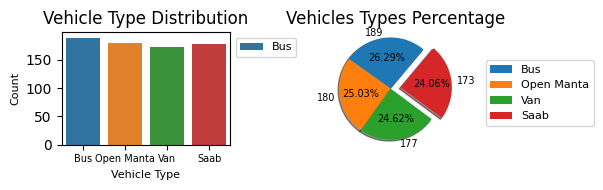

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=1,ncols=2, figsize=(5,2))
fig.subplots_adjust(top=0.45)
sns.countplot(x=data['Class'], ax = ax1)
ax1.set_xlabel('Vehicle Type', fontsize=8)
ax1.set_ylabel('Count', fontsize=8)
ax1.set_title('Vehicle Type Distribution')
ax1.set_xticks([0, 1, 2, 3])
ax1.set_xticklabels(labels=['Bus', 'Open Manta', 'Van', 'Saab'], fontsize=7)
ax1.legend(labels=['Bus', 'Open Manta', 'Van', 'Saab'], bbox_to_anchor = (1, 1), fontsize=8)

explode = (0, 0, 0, 0.2)
counts = data['Class'].value_counts()
ax2.pie(counts, explode=explode, labels = counts.values, autopct='%1.2f%%', shadow=True, startangle=50, textprops={'fontsize': 7})
ax2.axis('equal')
plt.title("Vehicles Types Percentage")
plt.legend(['Bus', 'Open Manta', 'Van', 'Saab'])
plt.tight_layout()
ax2.legend(labels=['Bus', 'Open Manta', 'Van', 'Saab'], bbox_to_anchor = (1, 0.8), fontsize = 8)
plt.show()

In [ ]:
data.duplicated().sum()

0

No duplicates are present

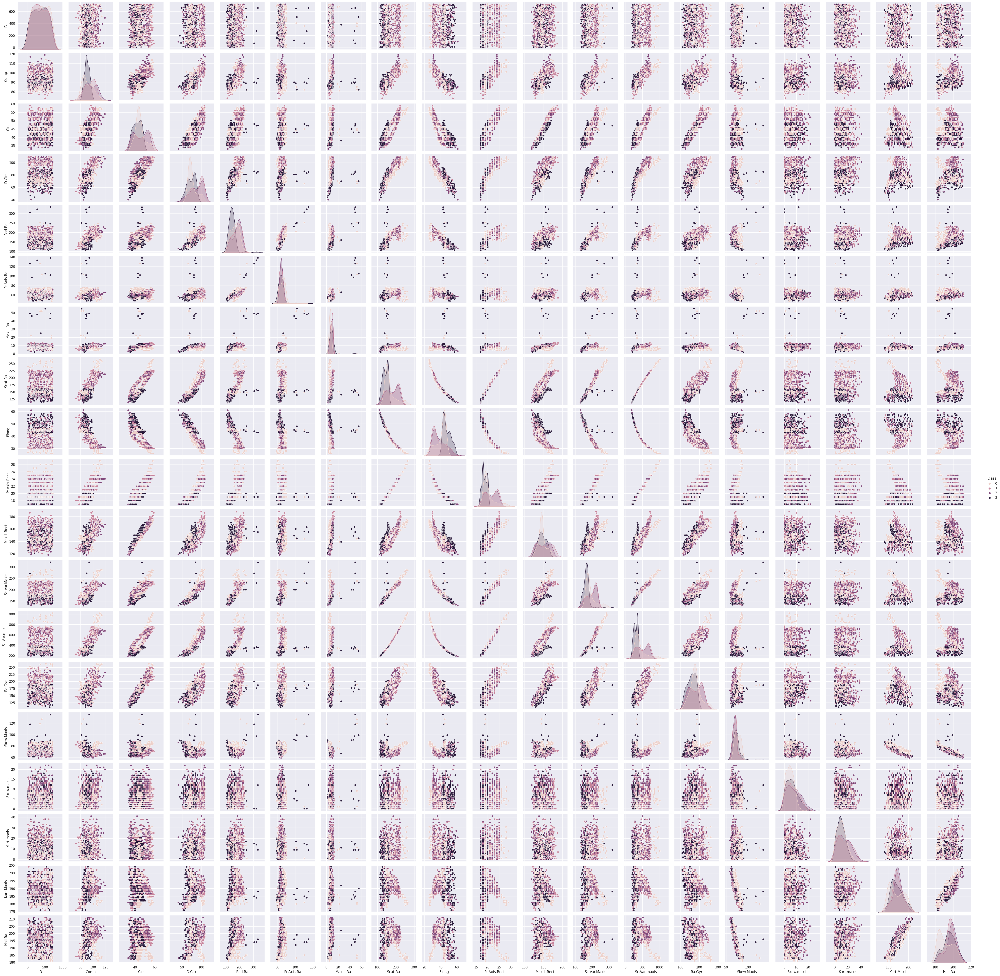

In [ ]:
sns.pairplot(data, hue='Class', diag_kind='kde')

Observations from above pair plot:

1.Compactness has positive correlation with circularity, distance circularity, radius ratio, scatter ratio & negative correlation with elogatedness

2.skewness and hollow ratio features are normally distributed

3.Max length aspect ratio is having less correlation with features

4.elogatedness has negative correlation with circularity, distance circularity, radius ratio, compactness, radius of gyration


In [ ]:
import scipy.stats as stats

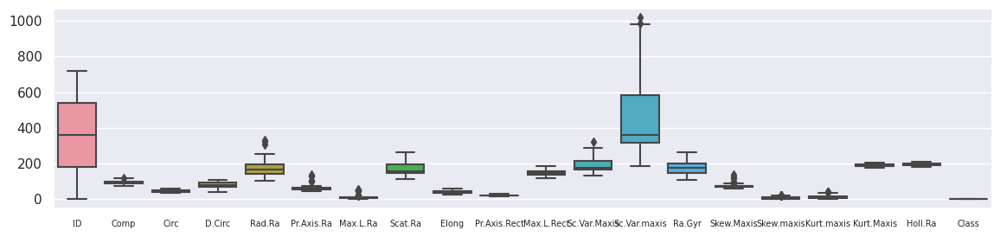

In [ ]:
sns.set(rc = {'figure.figsize': (14, 3)})
sns.boxplot(data)
plt.xticks(fontsize = 7)
plt.show()


In [ ]:
#Compactness outliers :
outlier_columns = []

Q1 =  data['Comp'].quantile(0.25) # 1º Quartile
Q3 =  data['Comp'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_Comp = Q1 - 1.5 * IQR   # lower bound 
UTV_Comp = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Compactness: <',LTV_Comp ,'and',UTV_Comp, ' > are outliers')
print('Number of outliers in Compactness column below the lower whisker =', 
      (data['Comp'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Compactness column above the upper whisker =', 
      (data['Comp'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Comp')
upperLowerBound_Disct = {'Comp':UTV_Comp}

Interquartile range =  12.0
Compactness: < 69.0 and 117.0  > are outliers
Number of outliers in Compactness column below the lower whisker = 0
Number of outliers in Compactness column above the upper whisker = 1


In [ ]:
#Radius ratio outliers

Q1 =  data['Rad.Ra'].quantile(0.25) # 1º Quartile
Q3 =  data['Rad.Ra'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_RadRa = Q1 - 1.5 * IQR   # lower bound 
UTV_RadRa = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Rad.Ra: <',LTV_RadRa ,'and', UTV_RadRa, ' > are outliers')
print('Number of outliers in Rad.Ra column below the lower whisker =', 
      (data['Rad.Ra'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Rad.Ra column above the upper whisker =', 
      (data['Rad.Ra'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Rad.Ra')
upperLowerBound_Disct['Rad.Ra'] = UTV_RadRa

Interquartile range =  53.5
Rad.Ra: < 60.75 and 274.75  > are outliers
Number of outliers in Rad.Ra column below the lower whisker = 0
Number of outliers in Rad.Ra column above the upper whisker = 3


In [ ]:
#Pr.Axis aspect ratio outliers

Q1 =  data['Pr.Axis.Ra'].quantile(0.25) # 1º Quartile
Q3 =  data['Pr.Axis.Ra'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_PrAxisRa = Q1 - 1.5 * IQR   # lower bound 
UTV_PrAxisRa = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Pr.Axis.Ra: <',LTV_PrAxisRa  ,'and', UTV_PrAxisRa, ' > are outliers')
print('Number of outliers in Pr.Axis.Ra column below the lower whisker =', 
      (data['Pr.Axis.Ra'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Pr.Axis.Ra column above the upper whisker =', 
      (data['Pr.Axis.Ra'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Pr.Axis.Ra')
upperLowerBound_Disct['Pr.Axis.Ra'] = UTV_PrAxisRa

Interquartile range =  8.0
Pr.Axis.Ra: < 45.0 and 77.0  > are outliers
Number of outliers in Pr.Axis.Ra column below the lower whisker = 0
Number of outliers in Pr.Axis.Ra column above the upper whisker = 8


In [ ]:
#Max length aspect ratio outliers

Q1 =  data['Max.L.Ra'].quantile(0.25) # 1º Quartile
Q3 =  data['Max.L.Ra'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_MaxLRa = Q1 - 1.5 * IQR   # lower bound 
UTV_MaxLRa = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Max.L.Ra: <',LTV_MaxLRa  ,'and', UTV_MaxLRa, ' > are outliers')
print('Number of outliers in Max.L.Ra column below the lower whisker =', 
      (data['Max.L.Ra'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Max.L.Ra column above the upper whisker =', 
      (data['Max.L.Ra'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Max.L.Ra')
upperLowerBound_Disct['Max.L.Ra']= UTV_MaxLRa


Interquartile range =  4.0
Max.L.Ra: < 0.0 and 16.0  > are outliers
Number of outliers in Max.L.Ra column below the lower whisker = 0
Number of outliers in Max.L.Ra column above the upper whisker = 12


In [ ]:
#scaled variance along Major axis outliers

Q1 =  data['Sc.Var.Maxis'].quantile(0.25) # 1º Quartile
Q3 =  data['Sc.Var.Maxis'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_ScVarMaxis = Q1 - 1.5 * IQR   # lower bound 
UTV_ScVarMaxis = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Sc.Var.Maxis: <',LTV_ScVarMaxis  ,'and', UTV_ScVarMaxis, ' > are outliers')
print('Number of outliers in Sc.Var.Maxis column below the lower whisker =', 
      (data['Sc.Var.Maxis'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Sc.Var.Maxis column above the upper whisker =', 
      (data['Sc.Var.Maxis'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Sc.Var.Maxis')
upperLowerBound_Disct['Sc.Var.Maxis'] = UTV_ScVarMaxis

Interquartile range =  49.0
Sc.Var.Maxis: < 93.5 and 289.5  > are outliers
Number of outliers in Sc.Var.Maxis column below the lower whisker = 0
Number of outliers in Sc.Var.Maxis column above the upper whisker = 1


In [ ]:
#scaled variance along major axis outliers

Q1 =  data['Sc.Var.maxis'].quantile(0.25) # 1º Quartile
Q3 =  data['Sc.Var.maxis'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_ScVarmaxis = Q1 - 1.5 * IQR   # lower bound 
UTV_ScVarmaxis = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Sc.Var.maxis: <',LTV_ScVarmaxis  ,'and', UTV_ScVarmaxis, ' > are outliers')
print('Number of outliers in Sc.Var.maxis column below the lower whisker =', 
      (data['Sc.Var.maxis'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Sc.Var.maxis column above the upper whisker =', 
      (data['Sc.Var.maxis'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Sc.Var.maxis')
upperLowerBound_Disct['Sc.Var.maxis'] = UTV_ScVarmaxis


Interquartile range =  267.5
Sc.Var.maxis: < -84.25 and 985.75  > are outliers
Number of outliers in Sc.Var.maxis column below the lower whisker = 0
Number of outliers in Sc.Var.maxis column above the upper whisker = 2


In [ ]:
#skewness about major axis outliers

Q1 =  data['Skew.Maxis'].quantile(0.25) # 1º Quartile
Q3 =  data['Skew.Maxis'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_SkewMaxis = Q1 - 1.5 * IQR   # lower bound 
UTV_SkewMaxis = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Skew.Maxis: <',LTV_SkewMaxis  ,'and', UTV_SkewMaxis, ' > are outliers')
print('Number of outliers in Skew.Maxis column below the lower whisker =', 
      (data['Skew.Maxis'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Skew.Maxis column above the upper whisker =', 
      (data['Skew.Maxis'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Skew.Maxis')
upperLowerBound_Disct['Skew.Maxis'] = UTV_SkewMaxis

Interquartile range =  8.0
Skew.Maxis: < 56.0 and 88.0  > are outliers
Number of outliers in Skew.Maxis column below the lower whisker = 0
Number of outliers in Skew.Maxis column above the upper whisker = 10


In [ ]:
#skewness about minor axis outliers

Q1 =  data['Skew.maxis'].quantile(0.25) # 1º Quartile
Q3 =  data['Skew.maxis'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_Skewmaxis = Q1 - 1.5 * IQR   # lower bound 
UTV_Skewmaxis = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Skew.maxis: <',LTV_Skewmaxis  ,'and', UTV_Skewmaxis, ' > are outliers')
print('Number of outliers in Skew.maxis column below the lower whisker =', 
      (data['Skew.maxis'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Skew.maxis column above the upper whisker =', 
      (data['Skew.maxis'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Skew.maxis')
upperLowerBound_Disct['Skew.maxis']= UTV_Skewmaxis


Interquartile range =  7.0
Skew.maxis: < -8.5 and 19.5  > are outliers
Number of outliers in Skew.maxis column below the lower whisker = 0
Number of outliers in Skew.maxis column above the upper whisker = 8


In [ ]:
#kurtosis about minor axis outliers

Q1 =  data['Kurt.maxis'].quantile(0.25) # 1º Quartile
Q3 =  data['Kurt.maxis'].quantile(0.75) # 3º Quartile
IQR = Q3 - Q1                     # Interquartile range

LTV_Kurtmaxis = Q1 - 1.5 * IQR   # lower bound 
UTV_Kurtmaxis = Q3 + 1.5 * IQR   # upper bound

print('Interquartile range = ', IQR)
print('Kurt.maxis: <',LTV_Kurtmaxis  ,'and', UTV_Kurtmaxis, ' > are outliers')
print('Number of outliers in Kurt.maxis column below the lower whisker =', 
      (data['Kurt.maxis'] < (Q1-(1.5*IQR))).sum())
print('Number of outliers in Kurt.maxis column above the upper whisker =', 
      (data['Kurt.maxis'] > (Q3+(1.5*IQR))).sum())

# storing column name and upper-lower bound value where outliers are presense

outlier_columns.append('Kurt.maxis')
upperLowerBound_Disct['Kurt.maxis']= UTV_Kurtmaxis

Interquartile range =  12.5
Kurt.maxis: < -13.25 and 36.75  > are outliers
Number of outliers in Kurt.maxis column below the lower whisker = 0
Number of outliers in Kurt.maxis column above the upper whisker = 6


Replacing outliers with median

In [ ]:
print('These are the columns which have outliers : \n\n',outlier_columns)
print('\n',upperLowerBound_Disct)

These are the columns which have outliers : 

 ['Comp', 'Rad.Ra', 'Pr.Axis.Ra', 'Max.L.Ra', 'Sc.Var.Maxis', 'Sc.Var.maxis', 'Skew.Maxis', 'Skew.maxis', 'Kurt.maxis']

 {'Comp': 117.0, 'Rad.Ra': 274.75, 'Pr.Axis.Ra': 77.0, 'Max.L.Ra': 16.0, 'Sc.Var.Maxis': 289.5, 'Sc.Var.maxis': 985.75, 'Skew.Maxis': 88.0, 'Skew.maxis': 19.5, 'Kurt.maxis': 36.75}


In [ ]:
data_new = data.copy()

In [ ]:
for col_name in data_new.columns[:-1]:
  q1 = data_new[col_name].quantile(0.25)
  q3 = data_new[col_name].quantile(0.75)
  iqr = q3 - q1
  low = q1 - 1.5 * iqr
  high = q3 + 1.5*iqr

  median = data_new[col_name].median() 
  data_new.loc[(data_new[col_name]< low) | (data_new[col_name]> high), col_name ] = median


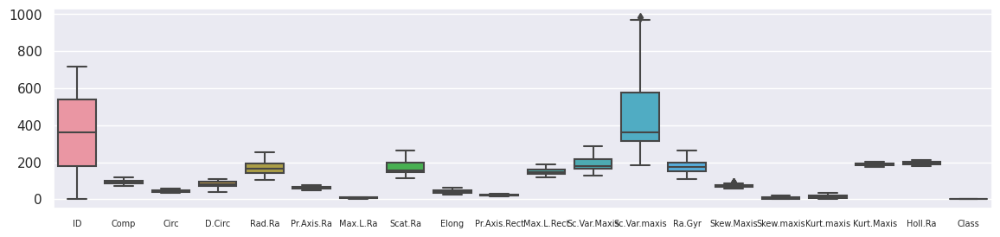

In [ ]:
sns.set(rc = {'figure.figsize': (14, 3)})
sns.boxplot(data_new)
plt.xticks(fontsize = 7)
plt.show()


outliers are almost removed except in Skew.Maxis & Sc.Var.maxis:

In [ ]:
data_new.shape

(719, 20)

In [ ]:
X1 = data_new.iloc[:, 1:-1]
y = data_new.iloc[:, -1]

In [ ]:
X1.shape

(719, 18)

In [ ]:
y.shape

(719,)

In [ ]:
X1.head()

,Comp,Circ,D.Circ,Rad.Ra,Pr.Axis.Ra,Max.L.Ra,Scat.Ra,Elong,Pr.Axis.Rect,Max.L.Rect,Sc.Var.Maxis,Sc.Var.maxis,Ra.Gyr,Skew.Maxis,Skew.maxis,Kurt.maxis,Kurt.Maxis,Holl.Ra
0,88,39,70,166,66,7,148,44,19,134,167,332,143,69,5,13,193,201
1,85,35,64,129,57,6,116,57,17,125,138,200,123,65,1,23,196,203
2,91,41,84,141,57,9,149,45,19,143,170,330,158,72,9,14,189,199
3,102,54,98,177,56,10,219,31,25,171,219,706,223,72,5,17,186,196
4,87,39,74,152,58,6,151,44,19,136,174,337,140,70,1,33,187,196


In [ ]:
from scipy.stats import zscore

In [ ]:
X = X1.apply(zscore)

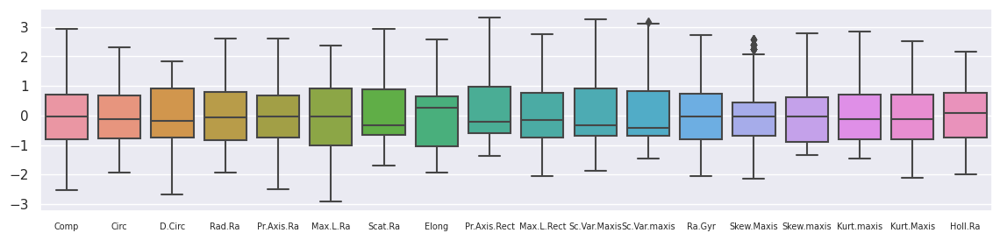

In [ ]:
sns.set(rc = {'figure.figsize': (14, 3)})
sns.boxplot(X)
plt.xticks(fontsize = 7)
plt.show()

In [ ]:
y.head()

0    0
1    3
2    3
3    1
4    2
Name: Class, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
SS = StandardScaler()

In [ ]:
X_train = SS.fit_transform(X_train)

In [ ]:
X_test = SS.transform(X_test)

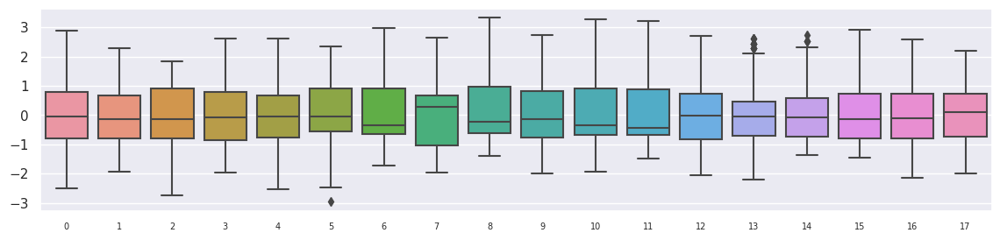

In [ ]:
sns.set(rc = {'figure.figsize': (14, 3)})
sns.boxplot(X_train)
plt.xticks(fontsize = 7)
plt.show()

Modelling

In [ ]:
from sklearn.linear_model import LogisticRegression, SGDClassifier

In [ ]:
from sklearn.svm import SVC

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [ ]:
from sklearn.metrics import f1_score

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

In [ ]:
LG = LogisticRegression()
SGD = SGDClassifier()
SVC = SVC()
KNN = KNeighborsClassifier()
DT = DecisionTreeClassifier()
RFC = RandomForestClassifier()
GBC = GradientBoostingClassifier()

In [ ]:
LG.fit(X_train, y_train)
SGD.fit(X_train, y_train)
SVC.fit(X_train, y_train)
KNN.fit(X_train, y_train)
DT.fit(X_train, y_train)
RFC.fit(X_train, y_train)
GBC.fit(X_train, y_train)

/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


GradientBoostingClassifier()

In [ ]:
S1 = LG.score(X_test, y_test)
S2 = SGD.score(X_test, y_test)
S3 = SVC.score(X_test, y_test)
S4 = KNN.score(X_test, y_test)
S5 = DT.score(X_test, y_test)
S6 = RFC.score(X_test, y_test)
S7 = GBC.score(X_test, y_test)

In [ ]:
Test_Scores = [S1, S2, S3, S4, S5, S6, S7]
Test_Scores

[0.7708333333333334,
 0.7291666666666666,
 0.7847222222222222,
 0.7361111111111112,
 0.7361111111111112,
 0.8055555555555556,
 0.7708333333333334]

Accuracy is high for SGD & SVC models for test scores

In [ ]:
S11 = LG.score(X_train, y_train)
S21 = SGD.score(X_train, y_train)
S31 = SVC.score(X_train, y_train)
S41 = KNN.score(X_train, y_train)
S51 = DT.score(X_train, y_train)
S61 = RFC.score(X_train, y_train)
S71 = GBC.score(X_train, y_train)

In [ ]:
Train_scores = [S11, S21, S31, S41, S51, S61, S71]
Train_scores

[0.8052173913043478,
 0.7669565217391304,
 0.8539130434782609,
 0.8069565217391305,
 1.0,
 1.0,
 0.9965217391304347]

Accuracy is high for SGD & SVC models for train scores

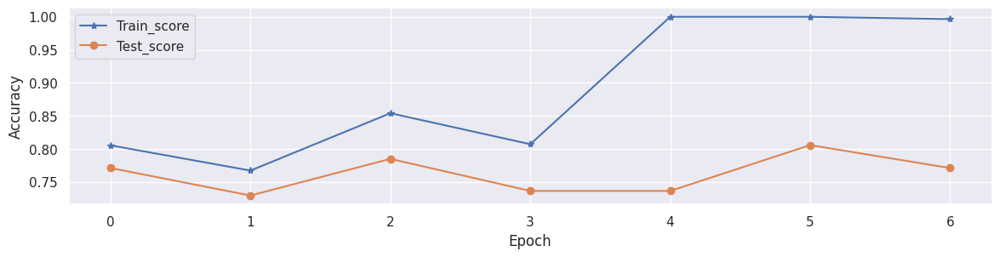

In [ ]:

plt.plot(range(len(Train_scores)),Train_scores, marker = '*', label = 'Train_score' )
plt.plot(range(len(Test_Scores)), Test_Scores, marker = 'o', label = 'Test_score' )
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

In [ ]:
YPredLG = LG.predict(X_test)
YPredSGD = SGD.predict(X_test)
YPredSVC = SVC.predict(X_test)
YPredKNN = KNN.predict(X_test)
YPredDT = DT.predict(X_test)
YPredRFC = RFC.predict(X_test)
YPredGBC = GBC.predict(X_test)

In [ ]:
F1SLG = f1_score(y_test, YPredLG, average= 'macro')
F1SSGD = f1_score(y_test, YPredSGD, average= 'macro')
F1SSVC = f1_score(y_test, YPredSVC, average= 'macro')
F1SKNN = f1_score(y_test, YPredKNN, average= 'macro')
F1SDT = f1_score(y_test, YPredDT, average= 'macro')
F1SRFC = f1_score(y_test, YPredRFC, average= 'macro')
F1SGBC = f1_score(y_test, YPredGBC, average= 'macro')


In [ ]:
F1_scores = [F1SLG, F1SSGD, F1SSVC, F1SKNN, F1SDT, F1SRFC, F1SGBC]
F1_scores

[0.7485191637630663,
 0.7153381451627066,
 0.7643528622501616,
 0.7173241416250096,
 0.7182330899124069,
 0.7824880120692378,
 0.7558383008736804]

f1_score is high for SGD & SVC models

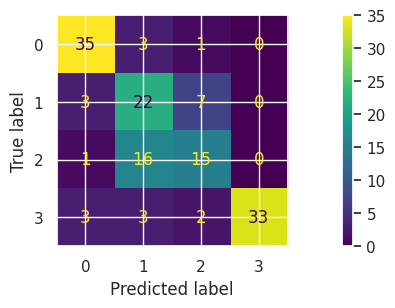

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(SGD, X_test, y_test)

model is predicting good for class 0 & class 3 , poorly for class 1

Parameters for SGD model:-

In [ ]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [ ]:
params = {'loss':['hinge', 'log_loss', 'modified_huber', 'squared_hinge', 'perceptron', 'squared_error'], 'penalty':['l2', 'l1', 'elasticnet'], 'alpha': [0.0001, 0.001, 0.01, 0.1],'max_iter': [100, 500, 1000, 5000]}

In [ ]:
GSCV = GridSearchCV(SGDClassifier(), param_grid= params, cv=10, n_jobs=-1)

In [ ]:
GSCV.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=SGDClassifier(), n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1],
                         'loss': ['hinge', 'log_loss', 'modified_huber',
                                  'squared_hinge', 'perceptron',
                                  'squared_error'],
                         'max_iter': [100, 500, 1000, 5000],
                         'penalty': ['l2', 'l1', 'elasticnet']})

In [ ]:
GSCV.best_params_

{'alpha': 0.001, 'loss': 'hinge', 'max_iter': 5000, 'penalty': 'l1'}

In [ ]:
GSCV.best_score_

0.785934664246824

In [ ]:
RSCV = RandomizedSearchCV(SGDClassifier(), param_distributions = params, cv=10, n_jobs=-1)


In [ ]:
RSCV.fit(X_train, y_train)

RandomizedSearchCV(cv=10, estimator=SGDClassifier(), n_jobs=-1,
                   param_distributions={'alpha': [0.0001, 0.001, 0.01, 0.1],
                                        'loss': ['hinge', 'log_loss',
                                                 'modified_huber',
                                                 'squared_hinge', 'perceptron',
                                                 'squared_error'],
                                        'max_iter': [100, 500, 1000, 5000],
                                        'penalty': ['l2', 'l1', 'elasticnet']})

In [ ]:
RSCV.best_params_

{'penalty': 'l1', 'max_iter': 500, 'loss': 'modified_huber', 'alpha': 0.01}

In [ ]:
RSCV.best_score_

0.7405928614640048

**SGD Model using the hyper-parameters given by gridsearchCV :-**

In [ ]:
from sklearn.linear_model import SGDClassifier

In [ ]:
sgd = SGDClassifier(alpha = 0.0001, loss = 'hinge', max_iter = 500, penalty = 'l1')

In [ ]:
sgd.fit(X_train, y_train)

SGDClassifier(max_iter=500, penalty='l1')

In [ ]:
YPredsgd = sgd.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


In [ ]:
accuracy = accuracy_score(y_test, YPredsgd)
precision = precision_score(y_test, YPredsgd, average= 'micro')
recall = recall_score(y_test, YPredsgd, average= 'micro')
f1 = f1_score(y_test, YPredsgd, average= 'micro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 score:", f1)

Accuracy: 0.7708333333333334
Precision: 0.7708333333333334
Recall: 0.7708333333333334
F1 score: 0.7708333333333333


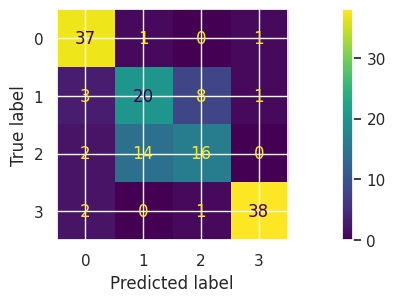

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(sgd, X_test, y_test)

the model is giving 77% efficiency

**SGD Model using the hyper-parameters given by randomizedsearchCV :-**

In [ ]:
from sklearn.linear_model import SGDClassifier

In [ ]:
sgd = SGDClassifier(penalty = 'elasticnet', max_iter = 500, loss = 'log_loss', alpha = 0.001)

In [ ]:
sgd.fit(X_train, y_train)

SGDClassifier(alpha=0.001, loss='log_loss', max_iter=500, penalty='elasticnet')

In [ ]:
YPredsgd = sgd.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, YPredsgd)
precision = precision_score(y_test, YPredsgd, average= 'micro')
recall = recall_score(y_test, YPredsgd, average= 'micro')
f1 = f1_score(y_test, YPredsgd, average= 'micro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 score:", f1)

Accuracy: 0.7430555555555556
Precision: 0.7430555555555556
Recall: 0.7430555555555556
F1 score: 0.7430555555555556


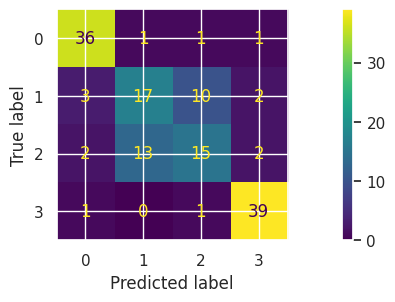

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(sgd, X_test, y_test)

the efficiency of this model is 77%

Parameters for SVM model:-

In [ ]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [ ]:
params = {'C': [0.1, 1, 10], 'gamma': ['scale', 'auto'], 'kernel': ['linear', 'rbf', 'sigmoid']}

In [ ]:
GSCV = GridSearchCV(SVC, param_grid= params, cv=10)

In [ ]:
GSCV.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'sigmoid']})

In [ ]:
GSCV.best_params_

{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}

In [ ]:
GSCV.best_score_

0.8087416817906836

In [ ]:
RSCV = RandomizedSearchCV(SVC, param_distributions = params, cv=10, n_jobs=-1)


In [ ]:
RSCV.fit(X_train, y_train)

RandomizedSearchCV(cv=10, estimator=SVC(), n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'rbf', 'sigmoid']})

In [ ]:
RSCV.best_params_

{'kernel': 'rbf', 'gamma': 'scale', 'C': 10}

In [ ]:
RSCV.best_score_

0.8087416817906836

**SVM Model using the hyper-parameters given by gridsearchCV :-**

In [ ]:
from sklearn.svm import SVC

In [ ]:
svc = SVC(C = 10, gamma = 'scale', kernel = 'rbf')

In [ ]:
svc.fit(X_train, y_train)

SVC(C=10)

In [ ]:
YPredsvc = svc.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, YPredsvc)
precision = precision_score(y_test, YPredsvc, average= 'micro')
recall = recall_score(y_test, YPredsvc, average= 'micro')
f1 = f1_score(y_test, YPredsvc, average= 'micro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 score:", f1)

Accuracy: 0.8263888888888888
Precision: 0.8263888888888888
Recall: 0.8263888888888888
F1 score: 0.8263888888888888


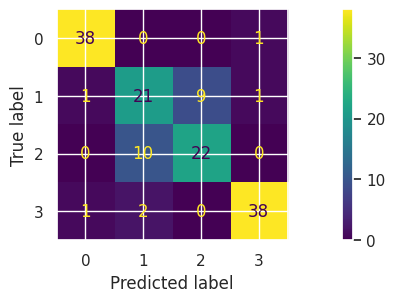

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(svc, X_test, y_test)

model is giving 82% efficiency

**SVM Model using the hyper-parameters given by randomizedsearchCV :-**

In [ ]:
from sklearn.svm import SVC

In [ ]:
svc = SVC(kernel = 'rbf', gamma = 'scale', C = 10)

In [ ]:
svc.fit(X_train, y_train)

SVC(C=10)

In [ ]:
YPredsvc1 = svc.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, YPredsvc1)
precision = precision_score(y_test, YPredsvc1, average= 'micro')
recall = recall_score(y_test, YPredsvc1, average= 'micro')
f1 = f1_score(y_test, YPredsvc1, average= 'micro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 score:", f1)

Accuracy: 0.8263888888888888
Precision: 0.8263888888888888
Recall: 0.8263888888888888
F1 score: 0.8263888888888888


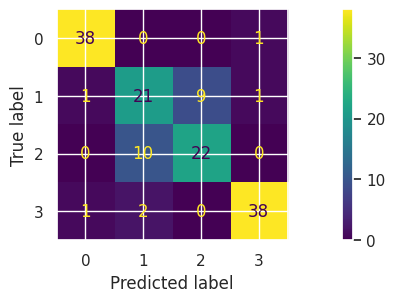

In [ ]:
disp = ConfusionMatrixDisplay.from_estimator(svc, X_test, y_test)

model is giving 82% efficiency

Conclusion:-

>>Among the imported classification models SGD & SVM are giving good scores. Hence they were further selected for hyper tuning the models

>>from the above models SVM model is performing well among the 4 models

>>SVM model is giving 82% accuracy rate with 18 dimensional features.Hence this models is preferred